# <b>Kelompok 1</b> 

<div style="color:white;display:fill;border-radius:8px;
            background-color:##326da8;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"></b> Deteksi Traffic Signs Menggunakan Model Pre-Trained YOLOv8s </b></p>
</div>

# 1. Install Library Ultralytics

In [1]:
# install ultralytics untuk deteksi objek, segmentasi objek, deteksi pose, klasifikasi gambar, tracking objek.
# simpel nya ini buat deteksi objek otomatis pakai YOLOv8
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.10.19
    Uninstalling nvidia-curand-cu12-10.3

## 1.1 Import dan Check Ultralytics

In [2]:
# import ultralytics yg tadi sudah diinstall
# mengapa harus install? karena kaggle sendiri tidak menyediakannya, jadi harus install
import ultralytics
ultralytics.checks()

Ultralytics 8.3.145 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6361.9/8062.4 GB disk)


## 1.2 Show GPU

In [3]:
# show gpu status
# cuma buat liat gpu apa yg dipakai
!nvidia-smi

Mon May 26 12:24:06 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# 2. Import Libraries

In [4]:
# import semua library yg dibutuhkan

import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

# 3. Display Images

In [5]:
# display beberapa image dari dataset
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

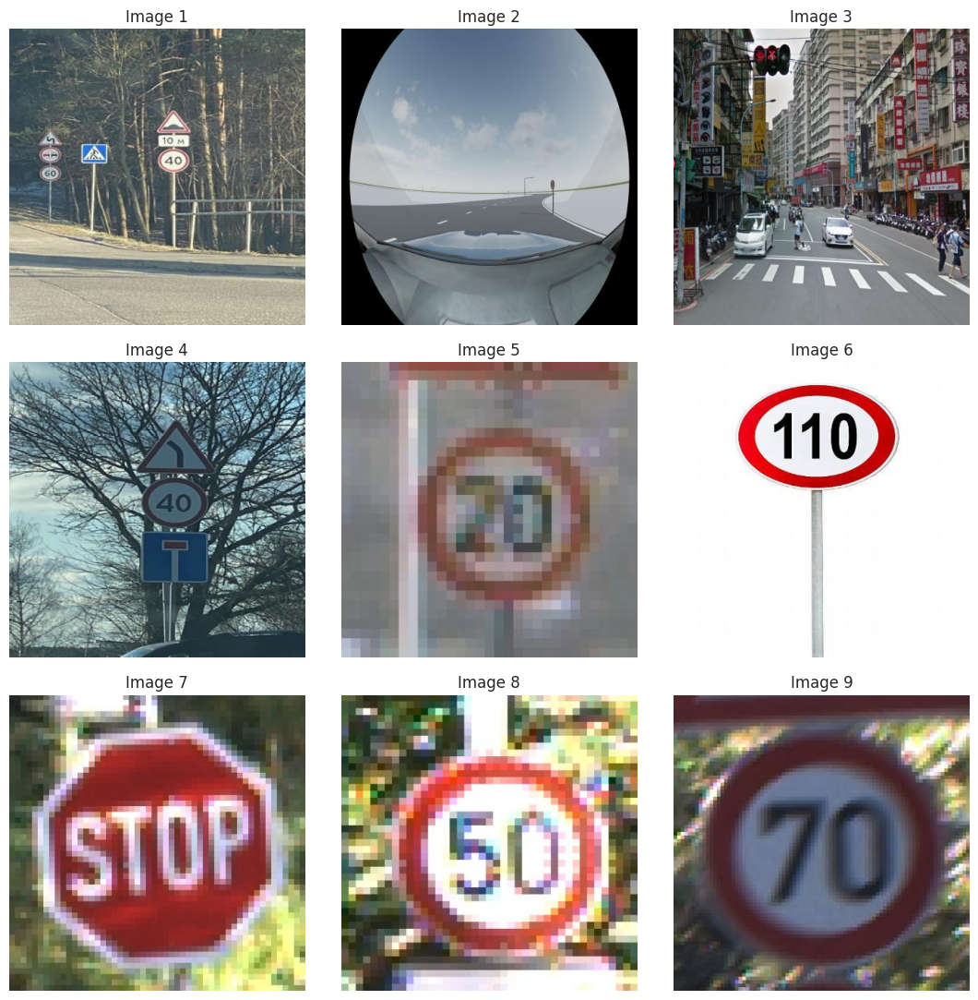

In [6]:
Image_dir = '/kaggle/input/cardetection/car/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

# 4. Image Information

In [7]:
# menampilkan berapa info dari image
# didapatkan bahwa dimensi image adalah 416x416 dan RGB
image = cv2.imread("/kaggle/input/cardetection/car/train/images/00000_00000_00012_png.rf.23f94508dba03ef2f8bd187da2ec9c26.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 416x416 and 3 channels.


# 5. Use YOLO8s Model

100%|██████████| 21.5M/21.5M [00:00<00:00, 166MB/s]



image 1/1 /kaggle/input/testing-data/types_of_traffic_road_signs_india_32b009f6cd.png: 352x640 1 person, 11 cars, 1 bus, 5 trucks, 41.6ms
Speed: 14.7ms preprocess, 41.6ms inference, 410.0ms postprocess per image at shape (1, 3, 352, 640)


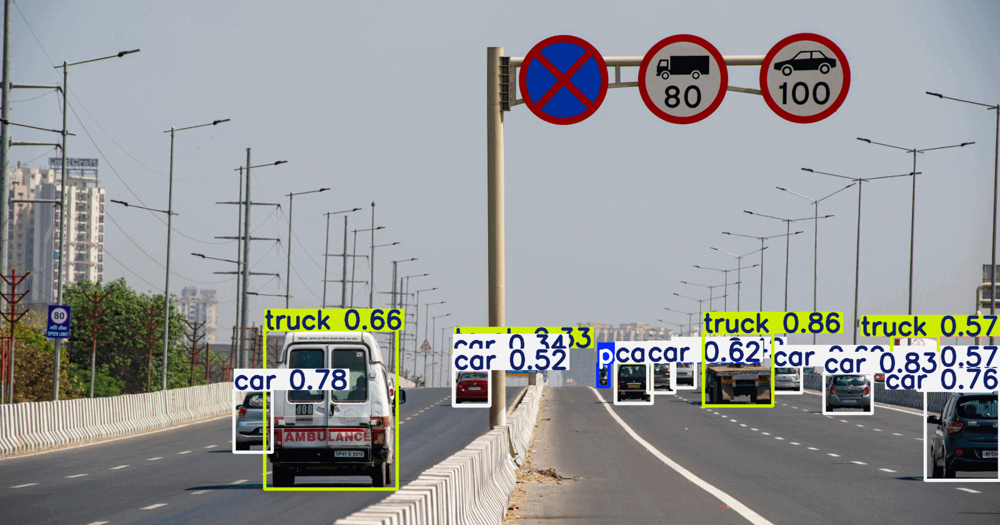

In [8]:
# model yg digunakan dalam percobaan ini adalah YOLOv8s, yang versi small
# apabila ingin menggunakan model lain, bisa un-comment saja

#model = YOLO("yolov8n.pt") 
model = YOLO("yolov8s.pt") 
#model = YOLO("yolov8m.pt") 

# Menentukan gambar yg akan digunakan untuk prediksi
image = "/kaggle/input/testing-data/types_of_traffic_road_signs_india_32b009f6cd.png"

# prediksi gambar
result_predict = model.predict(source = image, imgsz=(640))

# show hasil dari prediksi
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

# 6. Upgrade Ultralytics

In [9]:
# just in case, ketika ada upgrade an baru dari library Ultralytics
!pip install --upgrade ultralytics ray

# 7. Final Model

In [10]:
# literally versi terakhir dari model yang akan digunakan pada notebook ini
# jikalau ingin ganti model, misal menjadi versi nano atau medium, tinggal un-comment saja

Final_model = YOLO('yolov8s.pt')  
#Final_model = YOLO('yolov8n.pt')
#Final_model = YOLO('yolov8m.pt')

# Training The Final Model
Result_Final_model = Final_model.train(data="/kaggle/input/cardetection/car/data.yaml",epochs = 30, batch = -1, optimizer = 'auto')


Ultralytics 8.3.145 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/cardetection/car/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0

100%|██████████| 755k/755k [00:00<00:00, 16.4MB/s]


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 68.8MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 1.0±0.6 ms, read: 3.4±1.0 MB/s, size: 24.1 KB)


train: Scanning /kaggle/input/cardetection/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:24<00:00, 144.24it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/cardetection/car/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.18G reserved, 0.17G allocated, 14.40G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
    11141405       28.68         0.923         39.86         241.9        (1, 3, 640, 640)                    list
    11141405       57.35         1.216         23.85         91.95        (2, 3, 640, 640)                    list
    11141405       114.7         1.715         31.08         87.05        (4, 3, 640, 640)                    list
    11141405       229.4         2.697      

train: Scanning /kaggle/input/cardetection/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:07<00:00, 497.67it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/cardetection/car/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2.9±1.4 MB/s, size: 19.9 KB)


val: Scanning /kaggle/input/cardetection/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:05<00:00, 143.74it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.81G      0.892      4.205      1.212         28        640: 100%|██████████| 111/111 [00:53<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.72it/s]

                   all        801        944      0.438      0.417      0.342      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      6.84G     0.7198      1.684       1.07         36        640: 100%|██████████| 111/111 [00:53<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.02it/s]

                   all        801        944      0.446      0.558      0.496      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.21G     0.7264      1.358      1.064         19        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.07it/s]

                   all        801        944      0.628      0.621       0.65      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      6.83G     0.7163      1.233      1.061         27        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.05it/s]

                   all        801        944      0.791        0.7      0.785       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.21G      0.699      1.095      1.049         13        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.07it/s]

                   all        801        944      0.876      0.761      0.859      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      6.83G     0.6754     0.9824      1.032         22        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.04it/s]

                   all        801        944      0.908      0.792      0.882      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.21G       0.66     0.9482      1.028         21        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.04it/s]

                   all        801        944      0.935      0.781      0.882      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      6.83G     0.6432     0.8916      1.014         25        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]

                   all        801        944      0.912      0.822      0.896       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       7.2G     0.6356     0.8525      1.012         21        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]

                   all        801        944      0.937      0.816      0.906       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      6.85G     0.6239      0.805      1.002         27        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.04it/s]

                   all        801        944      0.935      0.826       0.91      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       7.2G     0.6249     0.7872      1.006         27        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.07it/s]

                   all        801        944      0.918      0.817      0.904      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.13G     0.6261     0.8022      1.007         16        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.06it/s]

                   all        801        944      0.918      0.874      0.938      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.19G     0.5972     0.7264     0.9898         23        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.10it/s]

                   all        801        944      0.916      0.902      0.947      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.13G     0.5916     0.7063     0.9887         27        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.05it/s]

                   all        801        944       0.95      0.869      0.939      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30       7.2G      0.581     0.6769      0.989         24        640: 100%|██████████| 111/111 [00:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.10it/s]

                   all        801        944      0.951      0.861      0.944      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      7.14G     0.5794     0.6601     0.9812         24        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.05it/s]

                   all        801        944      0.958      0.881      0.946      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       7.2G     0.5643     0.6456     0.9738         24        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.07it/s]

                   all        801        944       0.94       0.88      0.951       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.14G      0.558     0.6406     0.9705         26        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]

                   all        801        944      0.948      0.879      0.952       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.21G     0.5648     0.6277     0.9735         22        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.99it/s]

                   all        801        944      0.946      0.891      0.947      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.13G     0.5499     0.5927     0.9659         21        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.09it/s]

                   all        801        944      0.925      0.908      0.955      0.816


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       7.2G     0.5482     0.4052     0.9411         12        640: 100%|██████████| 111/111 [00:54<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.06it/s]

                   all        801        944      0.907      0.913      0.959      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      7.13G     0.5392     0.3883     0.9329         18        640: 100%|██████████| 111/111 [00:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.07it/s]

                   all        801        944      0.928      0.913      0.962      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      7.21G      0.534     0.3668     0.9332         12        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.10it/s]

                   all        801        944      0.954      0.914      0.963      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      7.13G     0.5245      0.351      0.922         10        640: 100%|██████████| 111/111 [00:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.09it/s]

                   all        801        944      0.956      0.914      0.963      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      7.21G     0.5155     0.3404       0.92         12        640: 100%|██████████| 111/111 [00:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.09it/s]

                   all        801        944      0.966      0.908      0.965      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      7.13G     0.5061     0.3286     0.9147         10        640: 100%|██████████| 111/111 [00:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.06it/s]

                   all        801        944      0.946      0.925      0.968      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30       7.2G     0.5005     0.3136     0.9102         15        640: 100%|██████████| 111/111 [00:53<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.06it/s]

                   all        801        944      0.962      0.923      0.971      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      7.13G     0.4915     0.3039     0.9073         10        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.88it/s]

                   all        801        944      0.942      0.944      0.971      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.21G     0.4849     0.2921     0.9046         12        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  1.98it/s]

                   all        801        944       0.95       0.94      0.971      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      7.13G     0.4754     0.2822     0.8979         13        640: 100%|██████████| 111/111 [00:53<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:06<00:00,  2.03it/s]

                   all        801        944       0.96      0.935       0.97      0.847



30 epochs completed in 0.508 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.145 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,131,389 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:07<00:00,  1.64it/s]


                   all        801        944       0.96      0.935       0.97      0.846
           Green Light         87        122      0.878      0.766      0.895      0.545
             Red Light         74        108      0.823      0.769      0.819      0.506
       Speed Limit 100         52         52      0.981      0.975      0.993      0.922
       Speed Limit 110         17         17      0.922          1      0.989      0.917
       Speed Limit 120         60         60      0.993      0.967      0.995      0.918
        Speed Limit 20         56         56      0.979      0.982      0.987      0.864
        Speed Limit 30         71         74      0.949      0.973       0.99      0.931
        Speed Limit 40         53         55       0.96      0.927       0.99      0.909
        Speed Limit 50         68         71      0.998      0.944       0.99      0.884
        Speed Limit 60         76         76      0.986      0.934      0.984      0.895
        Speed Limit 7

# 8. Visualization

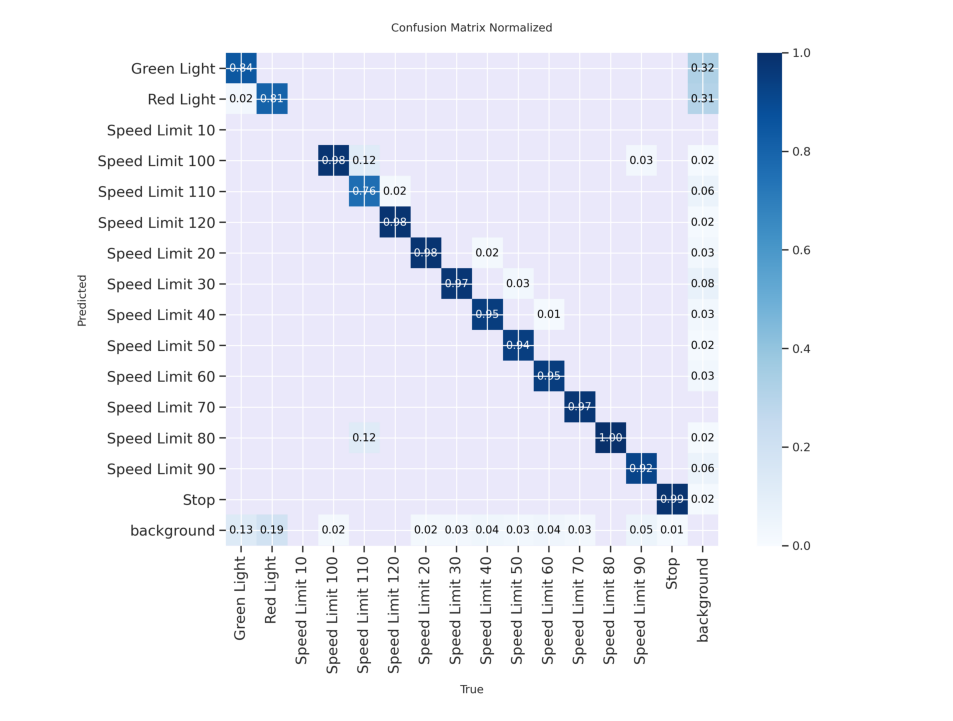

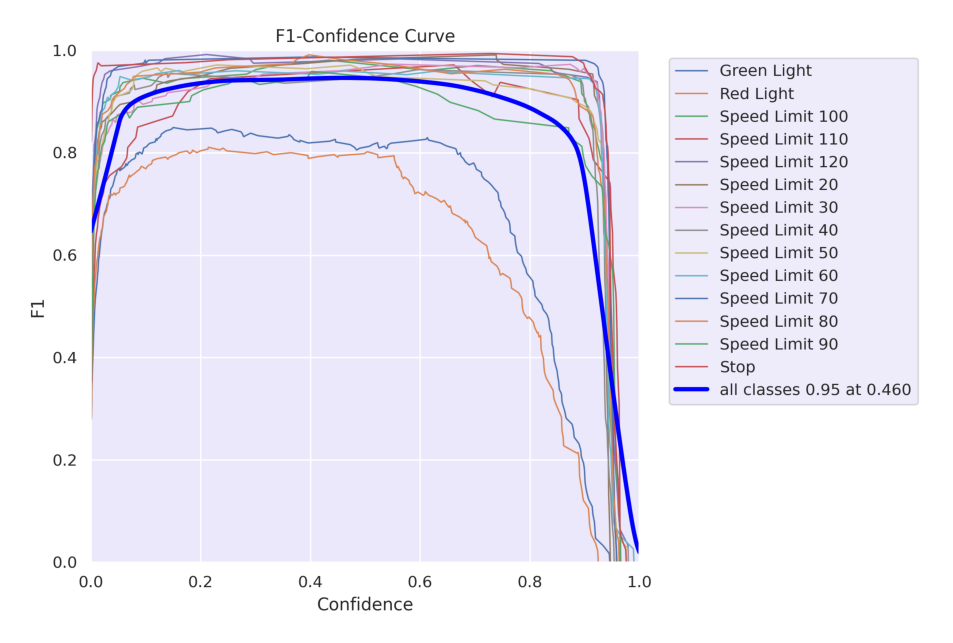

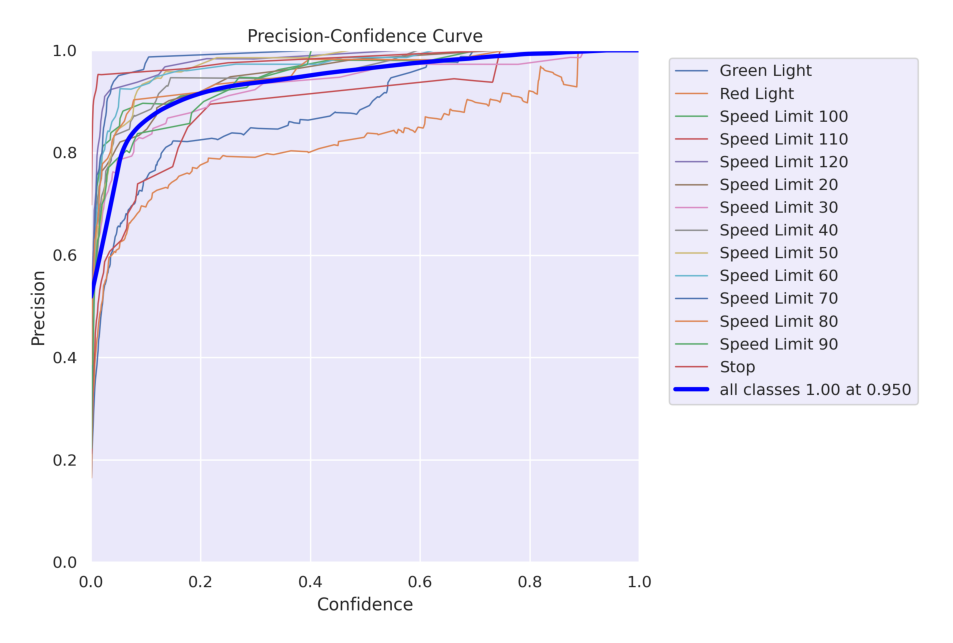

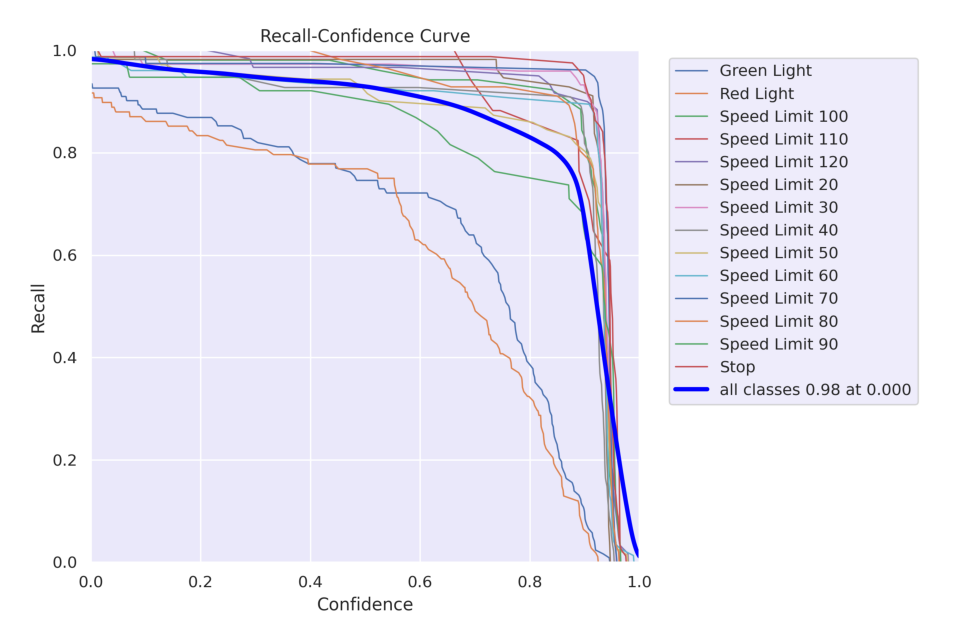

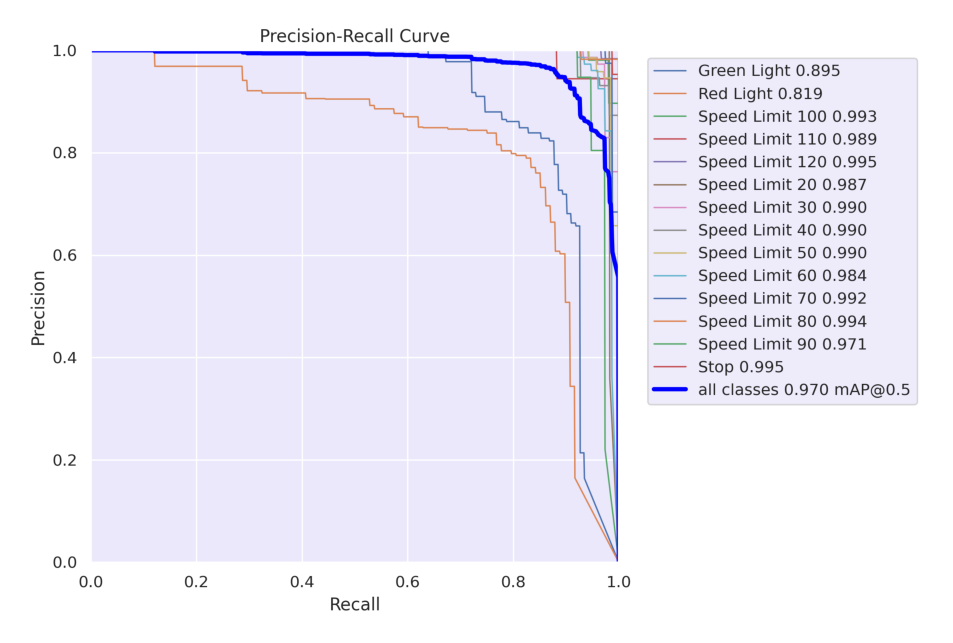

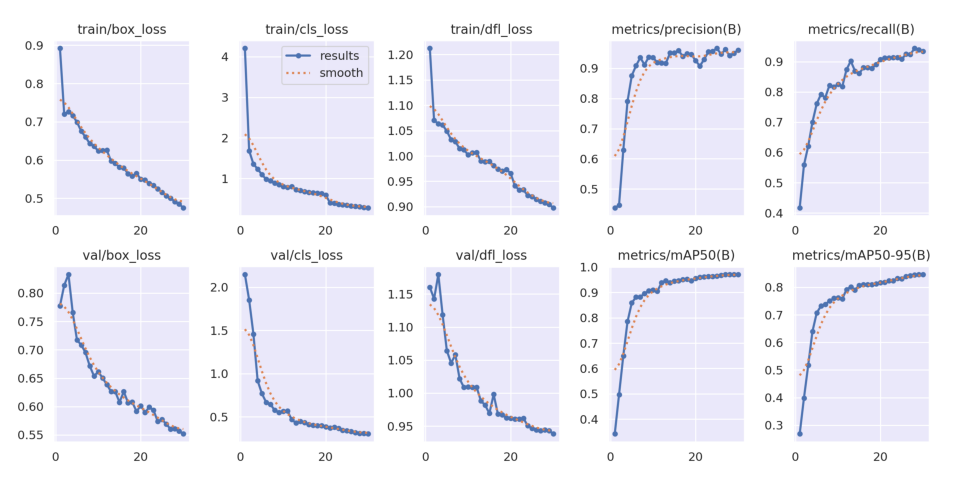

In [11]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/kaggle/working/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)

# 9. Numerical Result

In [12]:
Result_Final_model = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
Result_Final_model.tail(30)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,61.5307,0.89203,4.20512,1.21240,0.43833,0.41737,0.34220,0.26865,0.77749,2.14711,1.16030,0.000174,0.000174,0.000174
1,2,122.9010,0.71984,1.68371,1.06999,0.44617,0.55842,0.49610,0.39853,0.81390,1.85044,1.14274,0.000338,0.000338,0.000338
2,3,183.7370,0.72645,1.35816,1.06367,0.62834,0.62079,0.64950,0.51712,0.83297,1.45792,1.17979,0.000490,0.000490,0.000490
3,4,244.6200,0.71632,1.23256,1.06110,0.79059,0.70028,0.78517,0.63975,0.76567,0.91744,1.11884,0.000474,0.000474,0.000474
4,5,305.3570,0.69895,1.09479,1.04888,0.87558,0.76084,0.85920,0.70699,0.71737,0.76801,1.06425,0.000457,0.000457,0.000457
5,6,366.3770,0.67538,0.98236,1.03219,0.90829,0.79241,0.88155,0.73198,0.70851,0.66761,1.04545,0.000439,0.000439,0.000439
6,7,427.3690,0.66003,0.94824,1.02822,0.93473,0.78115,0.88231,0.73798,0.69522,0.64483,1.05793,0.000422,0.000422,0.000422
7,8,488.4180,0.64320,0.89164,1.01443,0.91152,0.82202,0.89613,0.75010,0.67156,0.57561,1.02181,0.000404,0.000404,0.000404
8,9,549.4680,0.63563,0.85249,1.01220,0.93694,0.81642,0.90625,0.75982,0.65381,0.54833,1.00871,0.000387,0.000387,0.000387
9,10,610.3070,0.62392,0.80497,1.00207,0.93545,0.82553,0.90979,0.76235,0.66129,0.56232,1.00925,0.000370,0.000370,0.000370


# 10. More Visualization, but SNS and PLT

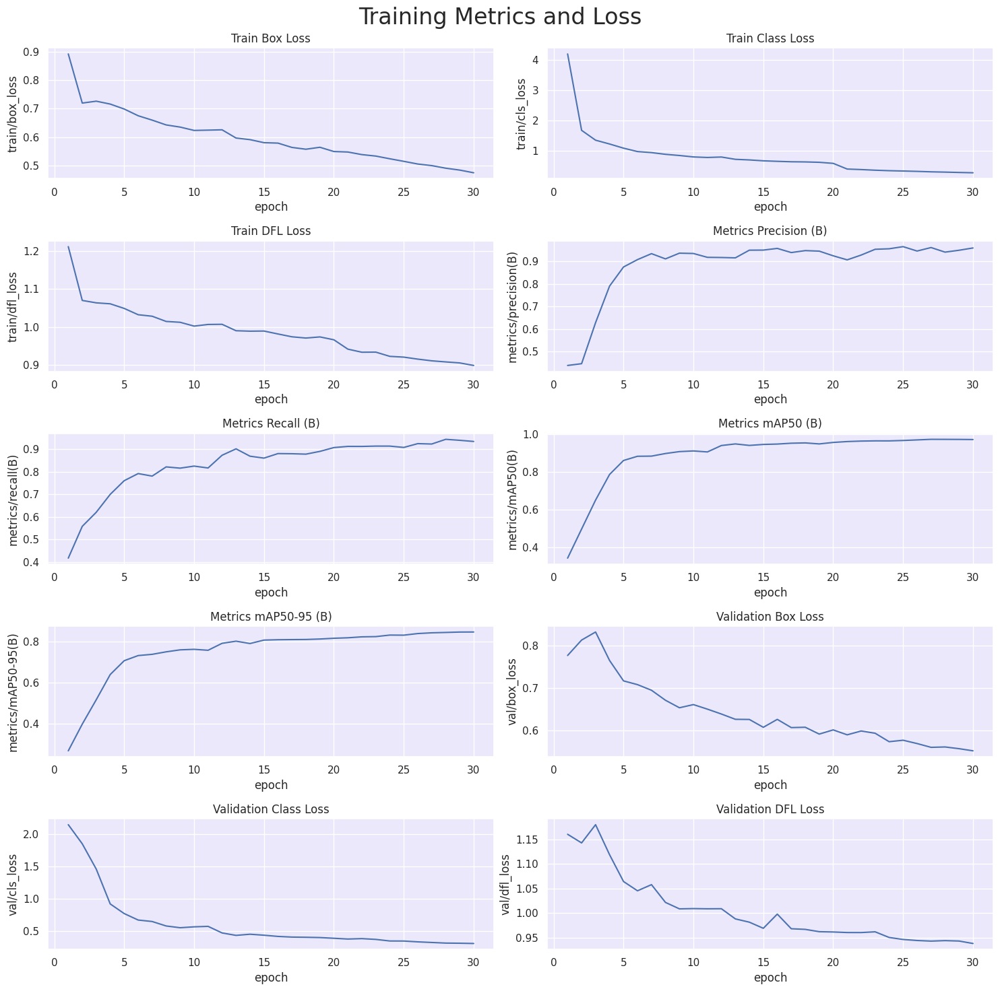

In [13]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

# 11. Load and Validate Model

In [14]:
# Loading the best performing model
Valid_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.145 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,131,389 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 7.9±4.4 MB/s, size: 11.2 KB)


val: Scanning /kaggle/input/cardetection/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:01<00:00, 448.50it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.68it/s]


                   all        801        944       0.96      0.935      0.971      0.849
           Green Light         87        122      0.878      0.766      0.892      0.547
             Red Light         74        108      0.823      0.769      0.819      0.509
       Speed Limit 100         52         52      0.981      0.975      0.993      0.928
       Speed Limit 110         17         17      0.922          1      0.989      0.927
       Speed Limit 120         60         60      0.993      0.967      0.995      0.921
        Speed Limit 20         56         56      0.979      0.982      0.987      0.863
        Speed Limit 30         71         74      0.949      0.973       0.99      0.931
        Speed Limit 40         53         55       0.96      0.927       0.99      0.907
        Speed Limit 50         68         71      0.998      0.944       0.99      0.888
        Speed Limit 60         76         76      0.986      0.934      0.984      0.898
        Speed Limit 7

# 12. Object Detection Result Visualization


0: 640x640 1 Speed Limit 50, 1 Speed Limit 80, 17.2ms
Speed: 3.1ms preprocess, 17.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 1 Speed Limit 110, 16.4ms
Speed: 2.2ms preprocess, 16.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 16.3ms
Speed: 1.8ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 40, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 15.6ms
Speed: 2.4ms preprocess, 15.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 14.7ms
Speed: 1.9ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 14.7ms
Speed: 1.9ms preprocess, 14.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 80, 14.8ms


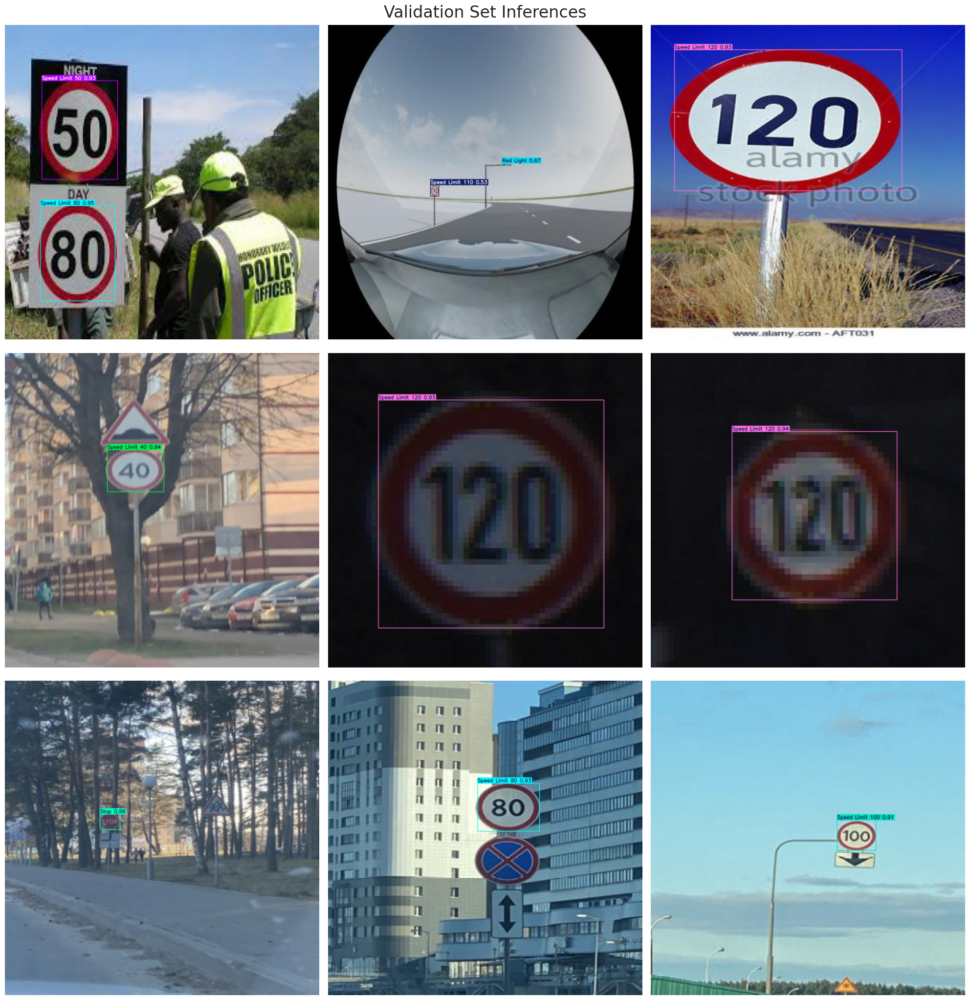

In [15]:
# Tampilkan hasil prediksi model pada data validasi, trus visualisasikan dalam ukuran 3x3 grid

# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '/kaggle/input/cardetection/car'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# 13. Display Test Video

Pada dataset sudah terdapat video yang diperuntukkan untuk test model, sehingga disini hanya perlu akses file nya pada path yang sudah tertera dalam dataset. Video yang terdapat pada dataset menggunakan efek fish eye, sehingga ini cukup menantang bagi model nya. Karena terdapat beberapa rambu lalu lintas pada video itu kurang jelas gambarnya.

In [16]:
# Convert video menjadi mp4
!ffmpeg -y -loglevel panic -i /kaggle/input/cardetection/video.mp4 output.mp4

# Display video
Video("output.mp4", width=960, embed=True)

In [17]:
# proses video frame per frame, lalu hasil video nya disimpan dalam path yg sudah tertera di bawah

results_generator=Valid_model.predict(source="/kaggle/input/cardetection/video.mp4", show=False,save = True, stream=True  )
for r in results_generator:
    pass


video 1/1 (frame 1/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.6ms
video 1/1 (frame 2/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 3/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 4/508) /kaggle/input/cardetection/video.mp4: 640x640 (no detections), 16.3ms
video 1/1 (frame 5/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 6/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 7/508) /kaggle/input/cardetection/video.mp4: 640x640 (no detections), 16.3ms
video 1/1 (frame 8/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 16.3ms
video 1/1 (frame 9/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 12.3ms
video 1/1 (frame 10/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Speed Limit 10, 11.9ms
video 1/1 (frame 11/508) /kaggle/input/cardetection/video.mp4: 640x640 1 Stop, 11.9ms
video 1/1 (frame 12/508) /kaggle/i

# 14. Display Predicted Video

Diperlihatkan dalam bentuk video bahwa model dapat mem-prediksi traffic signs dengan cukup baik, namun ada beberapa signs yang kurang bisa diprediksi, dalam artian confidence atau kepercayaan model dalam memprediksi itu kecil.
Contohnya ada sebuah sign yang diprediksi "Green Light" namun confidence nya 0.29 atau 29% saja, hasil tersebut termasuk kecil karena model "kurang yakin" akan tebakannya.

In [18]:
# show result
# Convert format
!ffmpeg -y -loglevel panic -i /kaggle/working/runs/detect/predict/video.avi result_out.mp4

# Display the video 
Video("result_out.mp4", width=960)

# 15. Finalization

Pada tahap terakhir ini, model akan disimpan dengan format onnx, untul output dari model bisa diakses pada path berikut:
/kaggle/working/runs/detect/train/weights/best.onnx

## 15.1 Export Model

In [19]:
# Export the model
Valid_model.export(format='onnx')

Ultralytics 8.3.145 🚀 Python-3.11.11 torch-2.6.0+cu124 CPU (Intel Xeon 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel CPUs. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 19, 8400) (21.5 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.53', 'onnxruntime-gpu'] not found, attempting AutoUpdate...


Using Python 3.11.11 environment at: /usr
Resolved 22 packages in 384ms



requirements: AutoUpdate success ✅ 14.6s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect



 Downloaded onnxruntime-gpu
Prepared 4 packages in 13.36s
Installed 4 packages in 13ms
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnxruntime-gpu==1.22.0
 + onnxslim==0.1.53



ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.53...
ONNX: export success ✅ 17.5s, saved as '/kaggle/working/runs/detect/train/weights/best.onnx' (42.7 MB)

Export complete (18.2s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=/kaggle/working/runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=/kaggle/working/runs/detect/train/weights/best.onnx imgsz=640 data=/kaggle/input/cardetection/car/data.yaml  
Visualize:       https://netron.app


'/kaggle/working/runs/detect/train/weights/best.onnx'